In [ ]:
!pip install pytesseract

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.2 MB 27.8 MB/s 
  Attempting uninstall: Pillow
    Found existing installation: Pillow 7.1.2
    Uninstalling Pillow-7.1.2:
      Successfully uninstalled Pillow-7.1.2


In [ ]:
!pip install  --force-reinstall tensorflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 588.3 MB 21 kB/s 
     |████████████████████████████████| 17.1 MB 83 kB/s 
     |████████████████████████████████| 4.8 MB 56.8 MB/s 
     |████████████████████████████████| 14.1 MB 66.5 MB/s 
     |████████████████████████████████| 65 kB 4.6 MB/s 
     |████████████████████████████████| 81 kB 10.9 MB/s 
     |████████████████████████████████| 4.5 MB 62.3 MB/s 
     |████████████████████████████████| 1.1 MB 56.2 MB/s 
     |████████████████████████████████| 1.2 MB 60.8 MB/s 
     |████████████████████████████████| 1.7 MB 66.8 MB/s 
     |████████████████████████████████| 6.0 MB 62.8 MB/s 
     |████████████████████████████████| 124 kB 79.3 MB/s 
     |████████████████████████████████| 42 kB 1.5 MB/s 
     |████████████████████████████████| 2.4 MB 58.8 MB/s 
     |████████████████████████████████| 57 kB 5.5 MB/s 
     |████████████████████████████████

In [ ]:
pip install natsort

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from natsort import natsorted

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf
import pytesseract as pt
import plotly.express as px
import matplotlib.pyplot as plt
import xml.etree.ElementTree as xet

from glob import glob
from skimage import io
from shutil import copy
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import TensorBoard
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.layers import Dense, Dropout, Flatten, Input
from tensorflow.keras.preprocessing.image import load_img, img_to_array

/usr/local/lib/python3.8/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [ ]:
import csv
labels_dict = dict(row=[],xmin=[],xmax=[],ymin=[],ymax=[])
with open('/content/sample_data/Final Labelled Dataset.csv.xls','rt')as f:
  data = natsorted(csv.reader(f))
  i=0
  dic={}
  for column in data:
    if column[3] == '1':
      if 'yes' in column[6]:
        print(column)
        dic[i]=column[5]
        i+=1

['B1_10 (14).jpg', '114159', '{}', '1', '0', '{"name":"rect","x":949,"y":2087,"width":696,"height":160}', '{"Type":"license plate","LP Number":"GJ01RJ4637","Complete LP":"yes","Quality":{}}']
['B1_10 (15).jpg', '112670', '{}', '1', '0', '{"name":"rect","x":309,"y":2095,"width":696,"height":156}', '{"Type":"license plate","LP Number":"GJ01RJ4637","Complete LP":"yes","Quality":{}}']
['B1_10 (18).jpg', '113810', '{}', '1', '0', '{"name":"rect","x":1530,"y":2229,"width":525,"height":127}', '{"Type":"license plate","LP Number":"GJ01KJ3047","Complete LP":"yes","Quality":{}}']
['B1_10 (19).jpg', '114081', '{}', '1', '0', '{"name":"rect","x":1068,"y":2225,"width":525,"height":130}', '{"Type":"license plate","LP Number":"GJ01KJ3047","Complete LP":"yes","Quality":{}}']
['B1_10 (20).jpg', '116236', '{}', '1', '0', '{"name":"rect","x":588,"y":2233,"width":532,"height":115}', '{"Type":"license plate","LP Number":"GJ01KJ3047","Complete LP":"yes","Quality":{}}']
['B1_10 (21).jpg', '114855', '{}', '1'

In [ ]:
x=[]
y=[]
width=[]
height=[]

for j in dic:
  words = dic[j].split(',')
  w1=words[1].split(':')
  w2=words[2].split(':')
  w3=words[3].split(':')
  w4=words[4].split(':')
  w4[1] = w4[1][:-1]

  x.append((w1[1]))
  y.append((w2[1]))
  width.append((w3[1]))
  height.append((w4[1]))

In [ ]:
print(height)

['160', '156', '127', '130', '115', '119', '141', '153', '141', '138', '123', '149', '149', '134', '123', '167', '153', '141', '130', '127', '130', '145', '108', '104', '104', '123', '127', '119', '112', '100', '104', '112', '104', '89', '86', '93', '97', '100', '97', '100', '89', '89', '78', '82', '119', '115', '100', '97', '89', '100', '130', '123', '123', '119', '108', '134', '138', '119', '104', '104', '97', '100', '130', '127', '134', '119', '112', '112', '141', '141', '130', '130', '115', '100', '104', '104', '108', '145', '134', '134', '134', '123', '127', '138', '127', '123', '119', '104', '93', '97', '100', '100', '119', '119', '115', '119', '115', '108', '104', '115', '97', '112', '88', '93', '117', '129', '170', '170', '155', '165', '175', '196', '149', '134', '129', '165', '139', '113', '170', '180', '93', '98', '93', '113', '93', '88', '108', '170', '155', '160', '180', '155', '149', '124', '104', '112', '104', '89', '97', '89', '104', '104', '108', '104', '93', '104', '15

In [ ]:
int(x[0]) + int(width[0])

1645

In [ ]:
import os

image_path = natsorted(os.listdir('/content/sample_data/Frames'))
print(image_path[172])

for i in range(len(image_path)):
  image_path[i] = "/content/sample_data/Frames/" + image_path[i]

print(image_path)

Main_07 (17).jpg
['/content/sample_data/Frames/B1_10 (14).jpg', '/content/sample_data/Frames/B1_10 (15).jpg', '/content/sample_data/Frames/B1_10 (18).jpg', '/content/sample_data/Frames/B1_10 (19).jpg', '/content/sample_data/Frames/B1_10 (20).jpg', '/content/sample_data/Frames/B1_10 (21).jpg', '/content/sample_data/Frames/B1_10 (25).jpg', '/content/sample_data/Frames/B1_10 (26).jpg', '/content/sample_data/Frames/B1_10 (30).jpg', '/content/sample_data/Frames/B1_10 (31).jpg', '/content/sample_data/Frames/B1_10 (32).jpg', '/content/sample_data/Frames/B1_10 (37).jpg', '/content/sample_data/Frames/B1_10 (38).jpg', '/content/sample_data/Frames/B1_10 (40).jpg', '/content/sample_data/Frames/B1_10 (41).jpg', '/content/sample_data/Frames/B1_10 (44).jpg', '/content/sample_data/Frames/B1_10 (45).jpg', '/content/sample_data/Frames/B1_10 (49).jpg', '/content/sample_data/Frames/B1_10 (50).jpg', '/content/sample_data/Frames/B1_10 (51).jpg', '/content/sample_data/Frames/B1_15 (12).jpg', '/content/sample

In [ ]:
#image_path = ['/content/B1_10 (14).jpg','/content/B1_10 (15).jpg','/content/B1_10 (18).jpg','/content/B1_10 (19).jpg','/content/B1_10 (20).jpg','/content/B1_10 (21).jpg','/content/B1_10 (25).jpg','/content/B1_10 (26).jpg','/content/B1_10 (30).jpg']


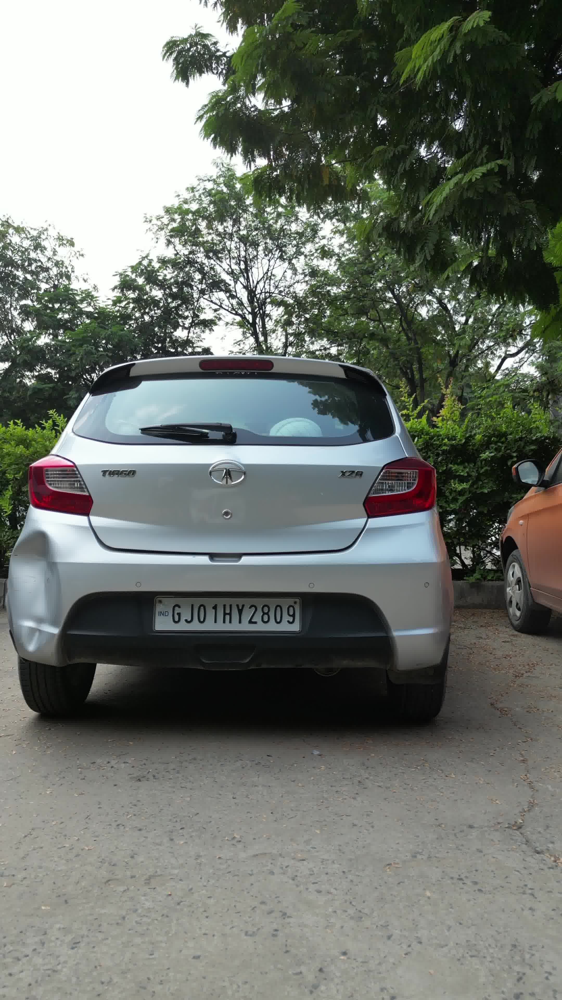

In [ ]:
file_path = '/content/sample_data/Frames/Main_07 (17).jpg' #path of our image N2.jpeg

img = cv2.imread(file_path) #read the image
# xmin-1804/ymin-1734/xmax-2493/ymax-1882
img = io.imread(file_path) #Read the image
fig = px.imshow(img)
fig.update_layout(width=600, height=500, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 8 - N2.jpeg with bounding box')
fig.add_shape(type='rect',x0=x[172], x1=int(x[172])+int(width[172]), y0=y[172], y1=int(y[172])+int(height[172]), xref='x', yref='y',line_color='cyan')

In [ ]:
xmin = []
xmax = []
ymin = []
ymax = []
print(len(image_path))
for i in range(len(image_path)):
  xmin.append(int(x[i]))
  xmax.append(int(x[i])+int(width[i]))
  ymin.append(int(y[i]))
  ymax.append(int(y[i])+int(height[i]))

data = []
output = []

for ind in range(len(image_path)):
    image = image_path[ind]
    img_arr = cv2.imread(image)
    h,w,d = img_arr.shape
    # Prepprocesing
    load_image = load_img(image,target_size=(224,224))
    load_image_arr = img_to_array(load_image)
    norm_load_image_arr = load_image_arr/255.0 # Normalization
    # Normalization to labels
    #xmin,xmax,ymin,ymax = labels[ind]
    nxmin,nxmax = xmin[ind]/w,xmax[ind]/w
    nymin,nymax = ymin[ind]/h,ymax[ind]/h
    label_norm = (nxmin,nxmax,nymin,nymax) # Normalized output
    # Append
    data.append(norm_load_image_arr)
    output.append(label_norm)

452


In [ ]:
X = np.array(data,dtype=np.float32)
y = np.array(output,dtype=np.float32)

In [ ]:
x_train,x_test,y_train,y_test = train_test_split(X,y,train_size=1,random_state=0)
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((1, 224, 224, 3), (451, 224, 224, 3), (1, 4), (451, 4))

In [ ]:
inception_resnet = InceptionResNetV2(weights="imagenet",include_top=False, input_tensor=Input(shape=(224,224,3)))
# ---------------------
headmodel = inception_resnet.output
headmodel = Flatten()(headmodel)
headmodel = Dense(500,activation="relu")(headmodel)
headmodel = Dense(250,activation="relu")(headmodel)
headmodel = Dense(4,activation='sigmoid')(headmodel)


# ---------- model
model = Model(inputs=inception_resnet.input,outputs=headmodel)

219055592/219055592 [==============================] - 10s 0us/step


In [ ]:
model.compile(loss='mse',optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4))
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
tfb = TensorBoard('object_detection')
history = model.fit(x=x_train,y=y_train,batch_size=10,epochs=150,
                    validation_data=(x_test,y_test),callbacks=[tfb])

Epoch 1/150
1/1 [==============================] - 105s 105s/step - loss: 0.0155 - val_loss: 0.1101
Epoch 2/150
1/1 [==============================] - 5s 5s/step - loss: 0.0765 - val_loss: 0.0964
Epoch 3/150
1/1 [==============================] - 5s 5s/step - loss: 0.0802 - val_loss: 0.1149
Epoch 4/150
1/1 [==============================] - 5s 5s/step - loss: 0.0492 - val_loss: 0.1039
Epoch 5/150
1/1 [==============================] - 3s 3s/step - loss: 0.0543 - val_loss: 0.1211
Epoch 6/150
1/1 [==============================] - 3s 3s/step - loss: 0.0685 - val_loss: 0.1197
Epoch 7/150
1/1 [==============================] - 5s 5s/step - loss: 0.0396 - val_loss: 0.1155
Epoch 8/150
1/1 [==============================] - 3s 3s/step - loss: 0.0427 - val_loss: 0.1234
Epoch 9/150
1/1 [==============================] - 5s 5s/step - loss: 0.0447 - val_loss: 0.1202
Epoch 10/150
1/1 [==============================] - 5s 5s/step - loss: 0.0473 - val_loss: 0.1082
Epoch 11/150
1/1 [=================

In [ ]:
model.save('./object_detection.h5')

In [ ]:
# Load model
model = tf.keras.models.load_model('./object_detection.h5')
print('Model loaded Sucessfully')

Model loaded Sucessfully


In [ ]:
path = '/content/sample_data/Frames/Main_18 (12).jpg'
image = load_img(path) # PIL object
image = np.array(image,dtype=np.uint8) # 8 bit array (0,255)
image1 = load_img(path,target_size=(224,224))
image_arr_224 = img_to_array(image1)/255.0  # Convert into array and get the normalized output

# Size of the orginal image
h,w,d = image.shape
print('Height of the image =',h)
print('Width of the image =',w)

Height of the image = 3840
Width of the image = 2160



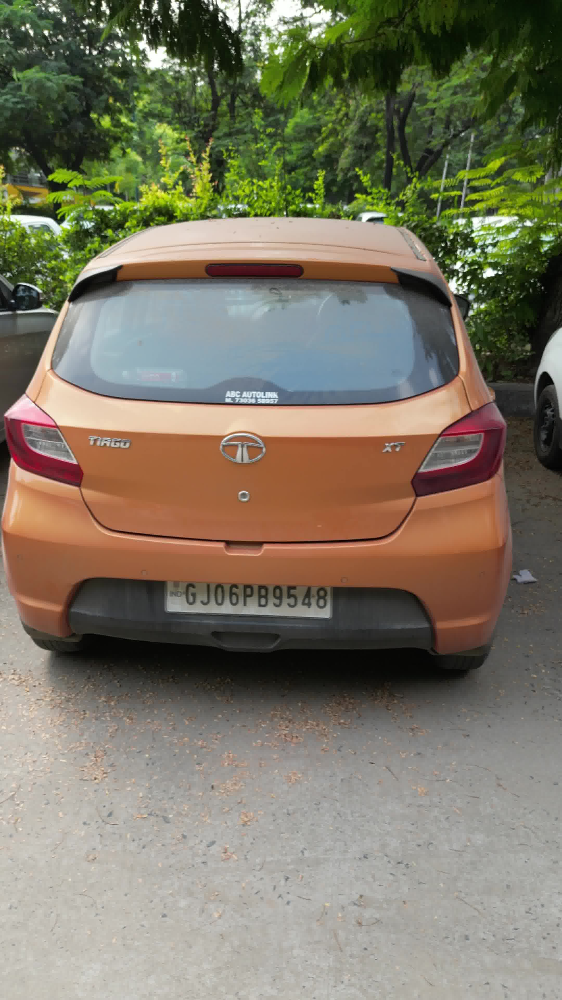

In [ ]:
fig = px.imshow(image)
fig.update_layout(width=700, height=500,  margin=dict(l=10, r=10, b=10, t=10), xaxis_title='Figure 13 - TEST Image')

In [ ]:
image_arr_224.shape

(224, 224, 3)

In [ ]:
test_arr = image_arr_224.reshape(1,224,224,3)
test_arr.shape

(1, 224, 224, 3)

In [ ]:
# Make predictions
coords = model.predict(test_arr)
coords

1/1 [==============================] - 0s 52ms/step


array([[0.16647981, 0.46316513, 0.61307997, 0.5083056 ]], dtype=float32)

In [ ]:
# Denormalize the values
denorm = np.array([w,w,h,h])
coords = coords * denorm
coords

array([[ 359.59639192, 1000.43668985, 2354.22706604, 1951.89353943]])

In [ ]:
coords = coords.astype(np.int32)
coords

array([[ 359, 1000, 2354, 1951]], dtype=int32)

In [ ]:
# Draw bounding on top the image
xmin, xmax,ymin,ymax = coords[0]
pt1 =(xmin,ymin)
pt2 =(xmax,ymax)
print(pt1, pt2)

(359, 2354) (1000, 1951)



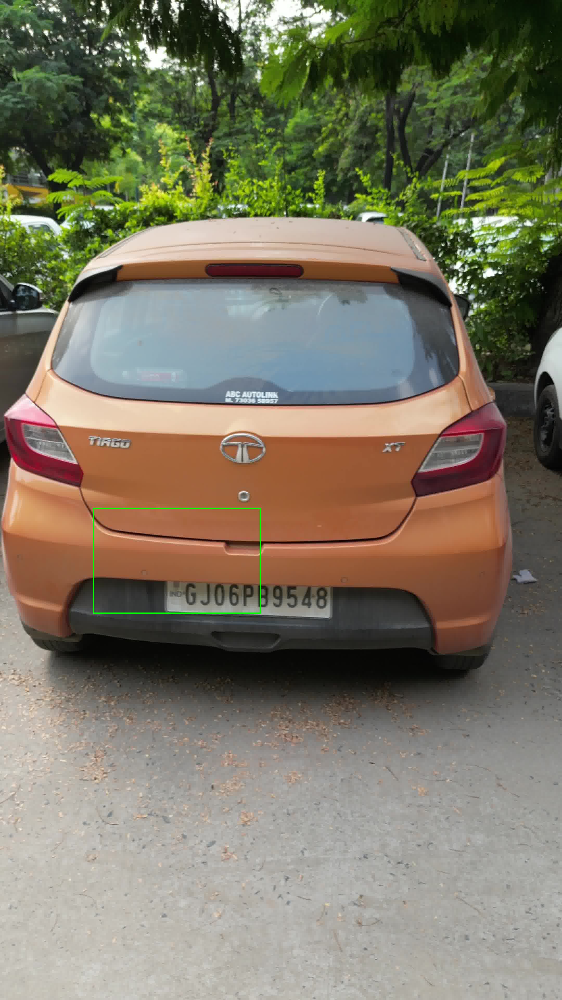

In [ ]:
cv2.rectangle(image,pt1,pt2,(0,255,0),3)
fig = px.imshow(image)
fig.update_layout(width=700, height=500, margin=dict(l=10, r=10, b=10, t=10))